# Notes

We provide this notebook for inference and visualizations.

You can either load images from a dataloader(see Sec. 1) or from a local path(see Sec. 2).

Welcome to join [IDEA](https://idea.edu.cn/en)([中文网址](https://idea.edu.cn/))!

In [ ]:
import sys
sys.path.append("/content/drive/MyDrive/colab/DINO")


In [ ]:
!pip install addict

In [ ]:
!pip install yapf==0.40.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.3/250.3 kB 4.2 MB/s eta 0:00:00


In [ ]:
!pip install timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 11.5 MB/s eta 0:00:00


In [ ]:
!python /content/drive/MyDrive/colab/DINO/models/dino/ops/setup.py build install

In [ ]:
import os, sys
import torch, json
import numpy as np

from main import build_model_main
from util.slconfig import SLConfig
from datasets import build_dataset
from util.visualizer import COCOVisualizer
from util import box_ops

In [ ]:
model_config_path = "/content/drive/MyDrive/colab/DINO/config/DINO/DINO_4scale.py" # change the path of the model config file
model_checkpoint_path = "/content/drive/MyDrive/colab/DINO/logs/DINO/R50-MS7/checkpoint0023.pth" # change the path of the model checkpoint
# See our Model Zoo section in README.md for more details about our pretrained models.

# Train Model

In [ ]:
!python /content/drive/MyDrive/colab/DINO/main.py \
	--output_dir /content/drive/MyDrive/colab/DINO/logs/DINO/R50-MS7 -c /content/drive/MyDrive/colab/DINO/config/DINO/DINO_4scale.py --coco_path "/content/drive/MyDrive/colab/firedino" \
	--options dn_scalar=100 embed_init_tgt=TRUE \
	dn_label_coef=1.0 dn_bbox_coef=1.0 use_ema=False \
	dn_box_noise_scale=1.0

In [153]:
args = SLConfig.fromfile(model_config_path)
args.device = 'cuda'
model, criterion, postprocessors = build_model_main(args)
checkpoint = torch.load(model_checkpoint_path, map_location='cpu')
model.load_state_dict(checkpoint['model'])
_ = model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


# Visualize Custom Images

In [ ]:
from PIL import Image
import datasets.transforms as T
import os

In [159]:
images = [img for img in os.listdir("/content/drive/MyDrive/colab/firedino/test") if ".jpg" in img]
path = "/content/drive/MyDrive/colab/firedino/test"

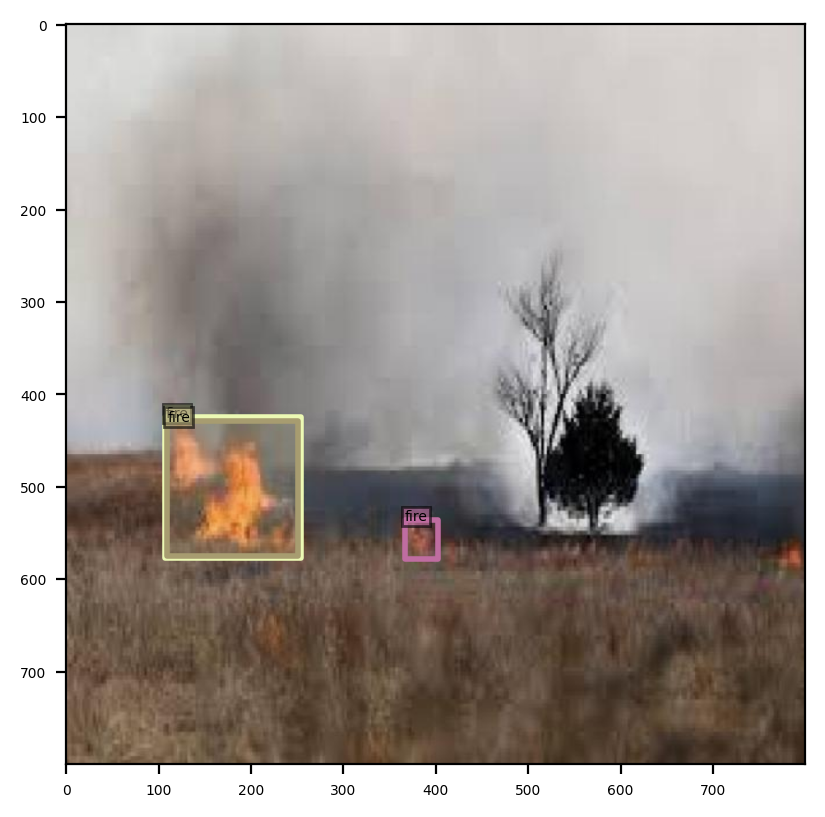

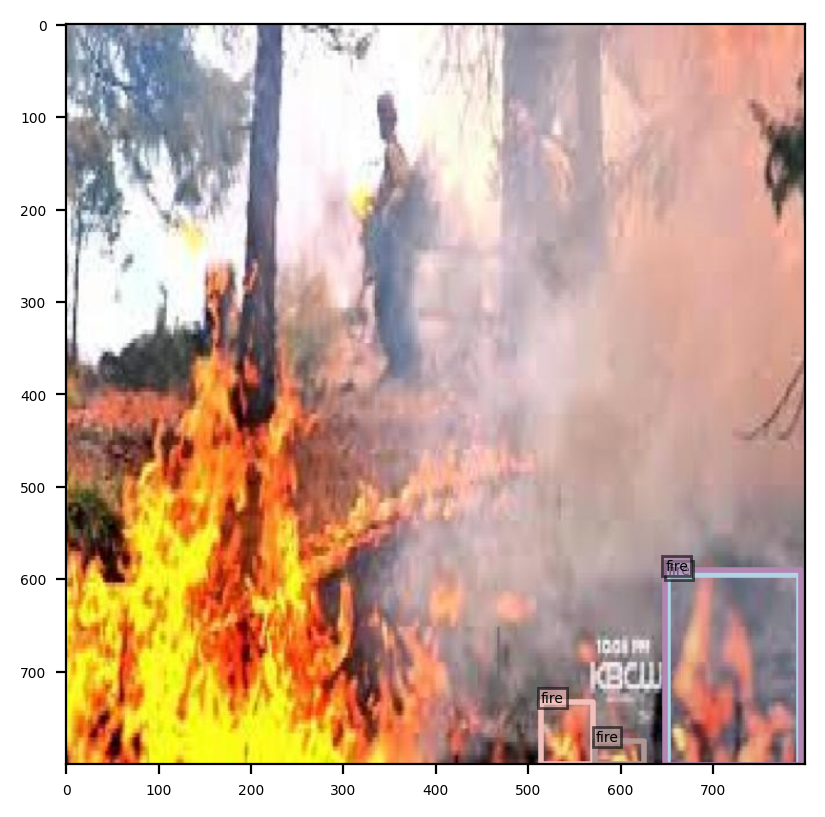

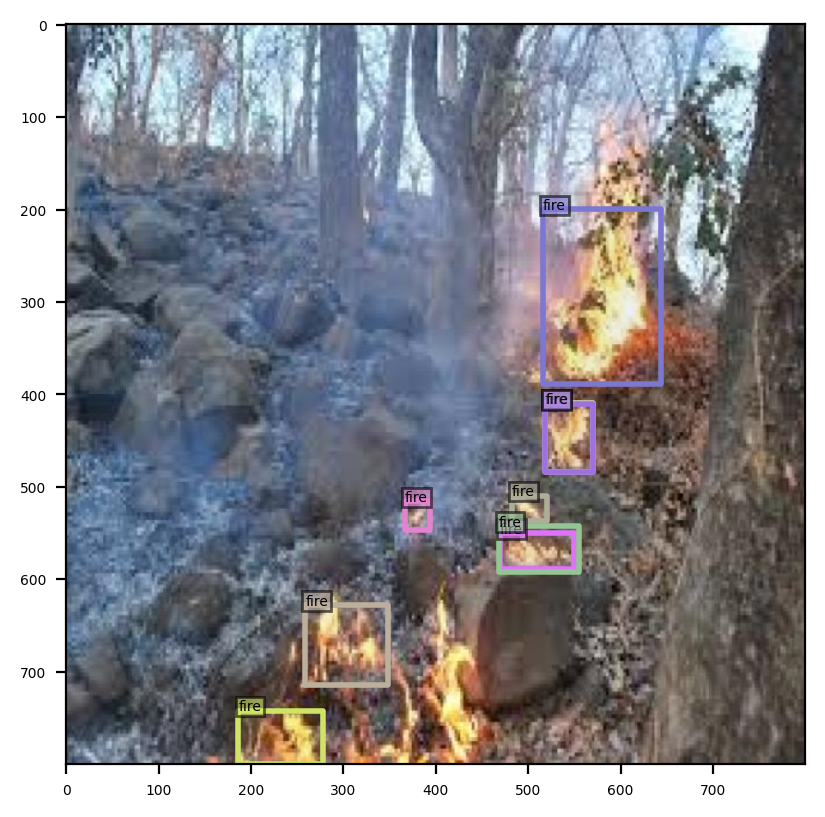

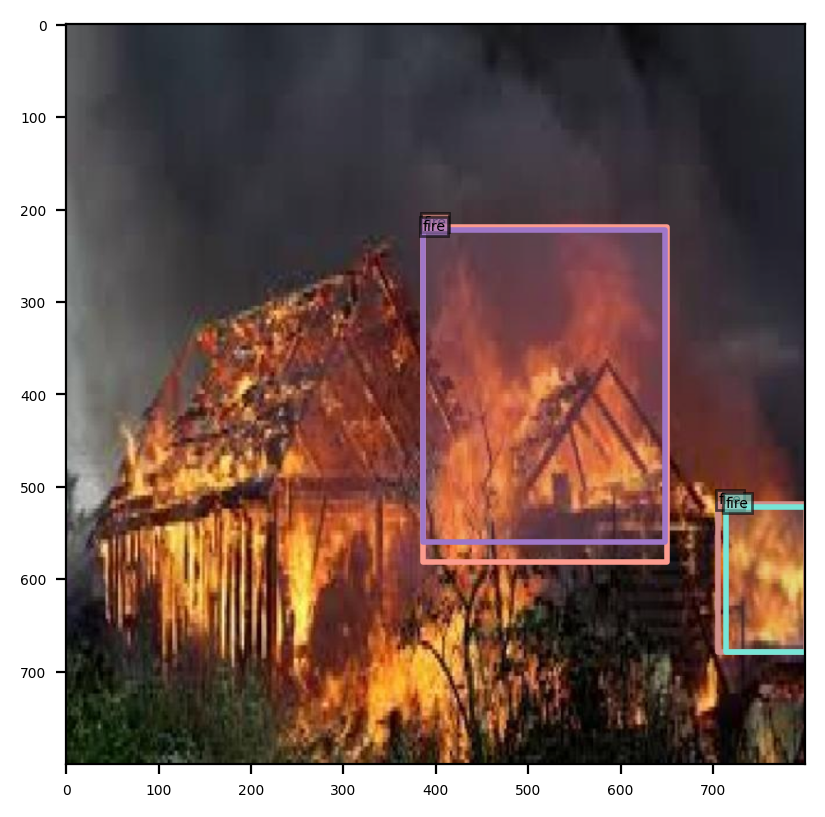

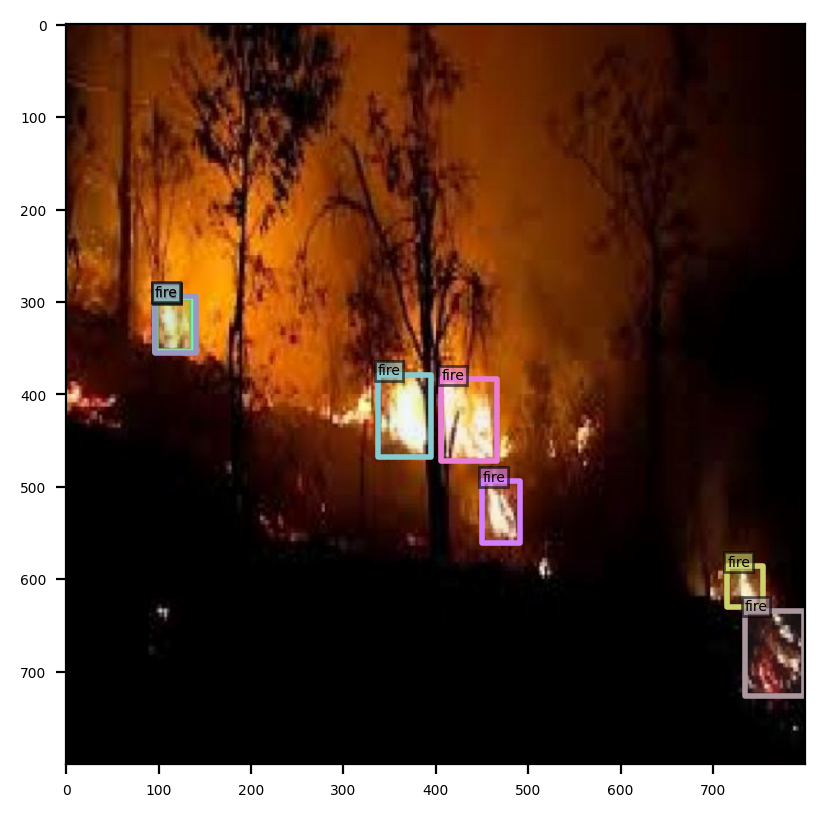

...

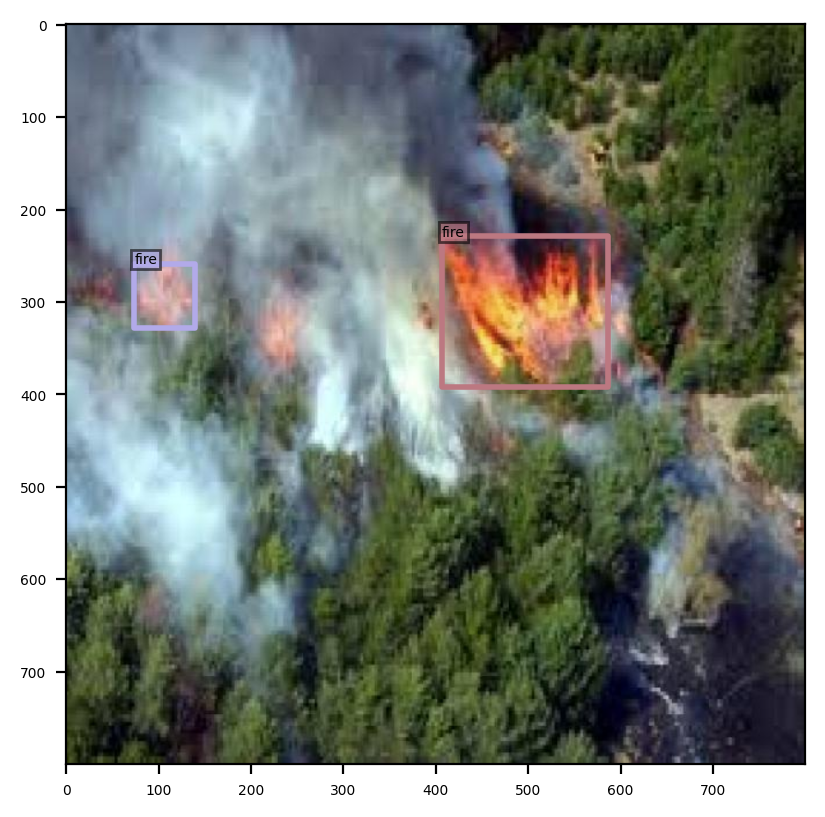

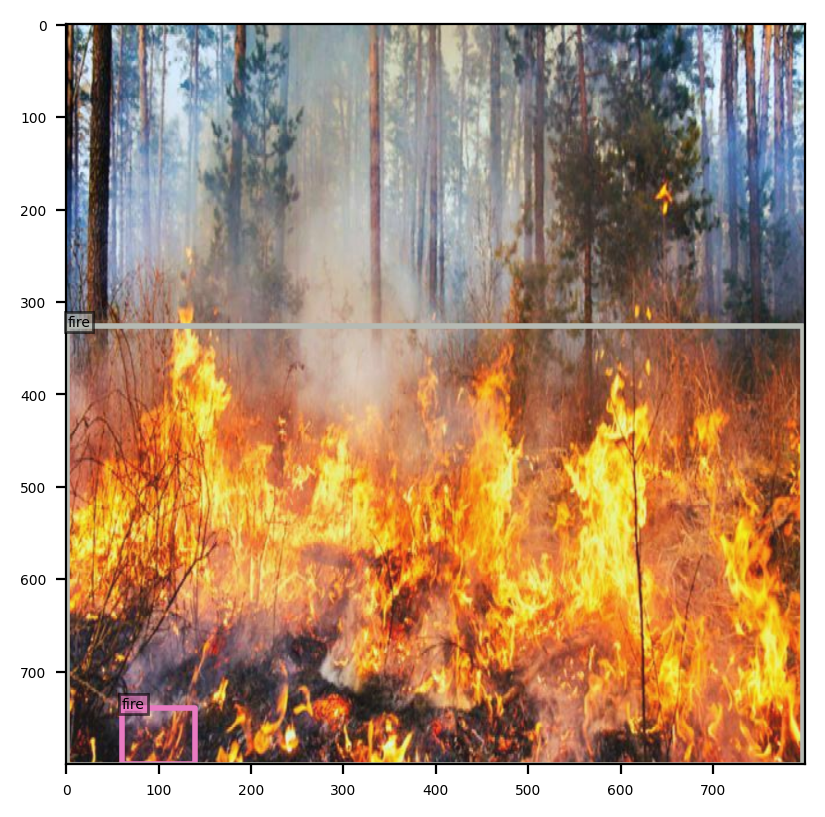

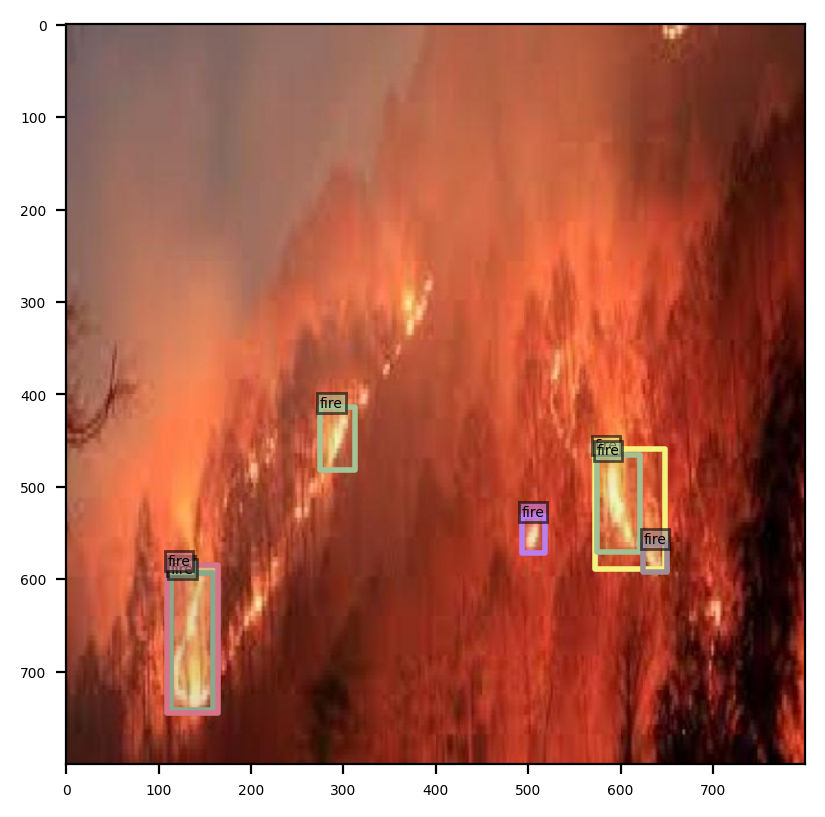

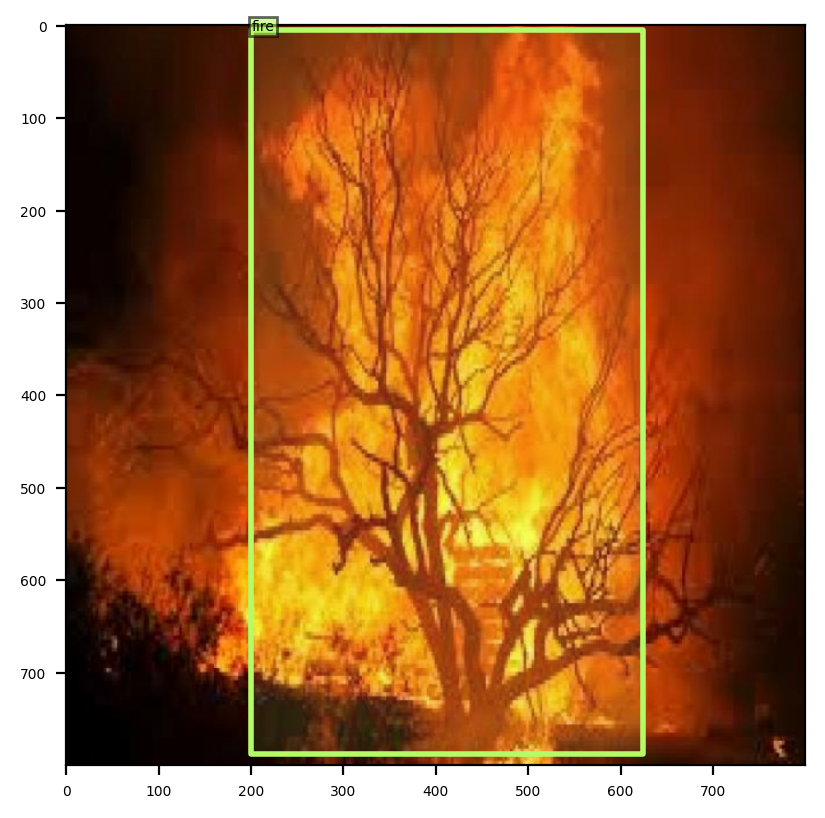

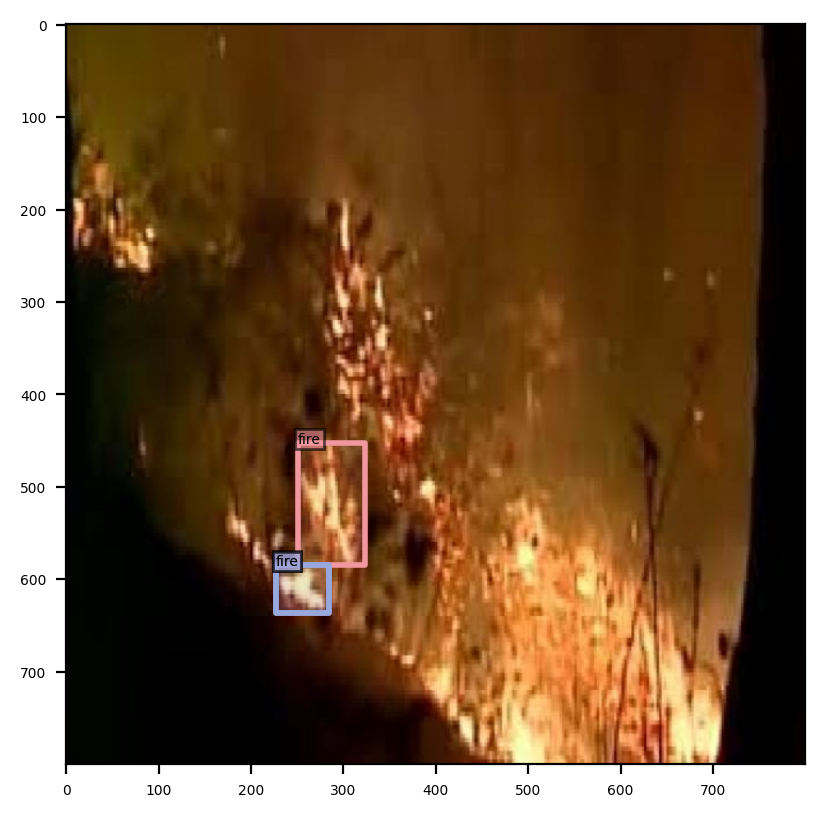

In [161]:
for image in images[:15]:
  image_path = os.path.join(path, image)
  image = Image.open(image_path).convert("RGB")
  image, _ = transform(image, None)
  output = model.cuda()(image[None].cuda())
  output = postprocessors['bbox'](output, torch.Tensor([[1.0, 1.0]]).cuda())[0]
  # visualize outputs
  thershold = 0.32 # set a thershold

  vslzr = COCOVisualizer()

  scores = output['scores']
  labels = output['labels']
  boxes = box_ops.box_xyxy_to_cxcywh(output['boxes'])
  select_mask = scores > thershold

  #box_label = [id2name[int(item)] for item in labels[select_mask]]
  #box_label = ["aero_plane"]
  box_label = ["fire" for i in range(len(boxes[select_mask]))]
  pred_dict = {
      'image_id': 4,
      'boxes': boxes[select_mask],
      'size': torch.Tensor([image.shape[1], image.shape[2]]),
      'box_label': box_label
  }
  vslzr.visualize(image, pred_dict, savedir=None, dpi=200)